In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import pandas as pd
import cv2

In [3]:
labels_df = pd.read_csv(r"/content/drive/MyDrive/TG/sorgo_256/training_gt.csv")
labels_df.head()
altura = 10
largura = 10

In [4]:
def add_bbox(coords):
    return [(x, y, altura, largura) for (x, y) in eval(coords)]

# Aplicar a função add_bbox à cada linha da coluna "loc", e armazenar os resultados em uma nova coluna "bounding_box"
labels_df['bounding_box'] = labels_df['locations'].apply(add_bbox)

In [5]:
labels_df.head()

,filename,count,locations,bounding_box
0,20160613_F54_training_s1pev6579h7m0y2wmtv1wv.png,52.0,"[(2, 155), (3, 233), (9, 74), (9, 155), (13, 2...","[(2, 155, 10, 10), (3, 233, 10, 10), (9, 74, 1..."
1,20160613_F54_training_qdfbns7ngxce7vovsvz03f.png,70.0,"[(0, 38), (14, 150), (16, 208), (21, 94), (21,...","[(0, 38, 10, 10), (14, 150, 10, 10), (16, 208,..."
2,20160613_F54_training_xtg1jzox20d4tn9gfkzo51.png,42.0,"[(5, 150), (6, 40), (7, 95), (10, 202), (21, 1...","[(5, 150, 10, 10), (6, 40, 10, 10), (7, 95, 10..."
3,20160613_F54_training_xwhu1kablzeeqj06eluixi.png,85.0,"[(0, 220), (6, 35), (10, 161), (11, 219), (14,...","[(0, 220, 10, 10), (6, 35, 10, 10), (10, 161, ..."
4,20160613_F54_training_unr4ka09fvnysn71kgsk5c.png,50.0,"[(2, 16), (9, 16), (17, 10), (19, 216), (27, 2...","[(2, 16, 10, 10), (9, 16, 10, 10), (17, 10, 10..."


In [6]:
labels_df.to_csv(r"/content/drive/MyDrive/TG/sorgo_256/training_gt_bb10.csv", index = False)

KeyboardInterrupt: ignored

Error: Failed to load image at path /content/drive/MyDrive/TG/sorgo_256/20160613_F54_training_256x256/20160613_F54_training_s1pev6579h7m0y2wmtv1wv.png


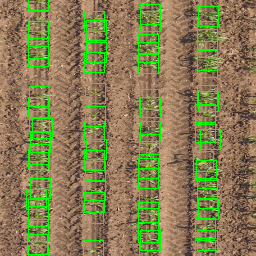

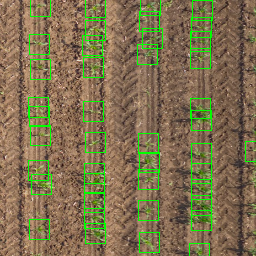

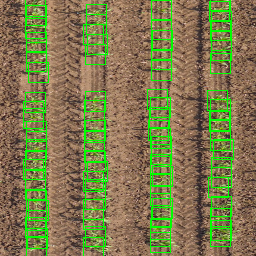

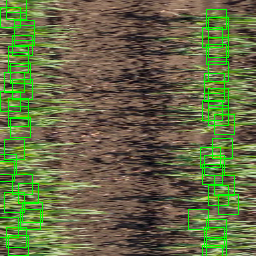

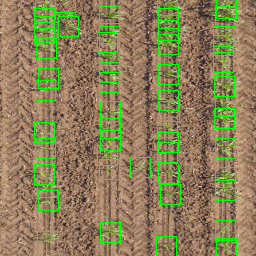

...

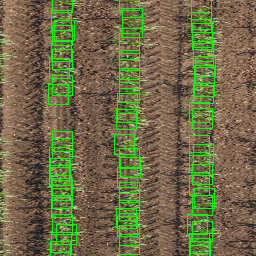

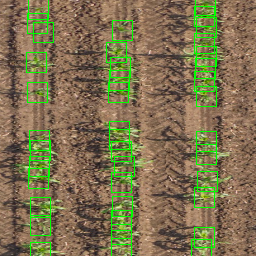

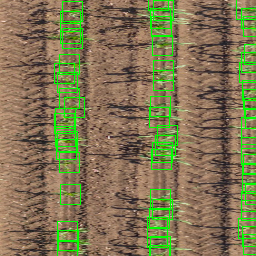

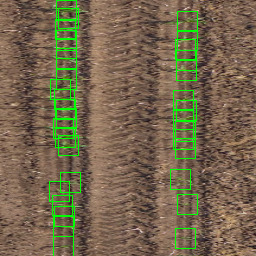

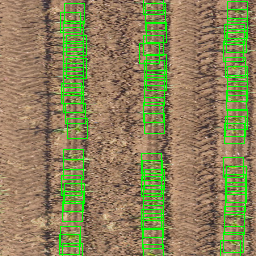

In [8]:
from google.colab.patches import cv2_imshow

for i in range(100):
    image_name = labels_df.iloc[i]['filename']
    coordinates_tuples = labels_df.iloc[i]['bounding_box']
    image_path = "/content/drive/MyDrive/TG/sorgo_256/20160613_F54_training_256x256/" + image_name
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Failed to load image at path {image_path}")
        continue
    
    for coord in coordinates_tuples:
        x = coord[1]
        y = coord[0]
        altura = coord[2]
        largura = coord[3]
        cv2.rectangle(image, (x-largura, y-largura), (x+largura, y+altura), (0, 255, 0), 1)
    cv2_imshow(image)
    cv2.waitKey(0)
cv2.destroyAllWindows()